In [1]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

plt.rcParams["figure.dpi"] = 1024

In [2]:
#Declare variables that will contain the (unpacked) data
data_A = []
data_B = []
data_C = []
data_D = []
data_E = []
data_F = []

#Path to data files
dataPath = r"C:\Active Projects\BEP_Collisions\Data\\"

#f = open(r"C:\Active Projects\BEP_Collisions\Data\Sim_B4\simData_B4.txt", "r")
#dataString = f.read()
#f.close()

In [3]:
#Delimiters
SIM_DLMT = "#\n"
CONTENT_DLMT = "\n"
VALUE_DLMT = ";"
ARR_DLMT = "$"

File layout

[Header] GM,S,M,maxI,mina,maxa,maxeps,m,s,Tsim,maxiter,initTime,checks,seed,N,pairs,pairsInTime

[Distribution] t0:a:c: etc

[Collision] #particles,colListSize,t,r,elapsedRunTime

[Collision]

...

[Distribution (final)] #

(repeat for each simulation)

In [4]:
#Define dictionaries to help use the data
hIndex = {
    "GM": 0,
    "S": 1,
    "M": 2,
    "maxI": 3,
    "mina": 4,
    "maxa": 5,
    "maxeps": 6,
    "m": 7,
    "s": 8,
    "Tprec": 9,
    "maxiter": 10,
    "initTime": 11,
    "checks": 12,
    "seed": 13,
    "N": 14,
    "pairs": 15,
    "pairsInTime": 16
}

dIndex = {
    "t0": 0,
    "a": 1,
    "c": 2,
    "s": 3,
    "m": 4,
    "r0.x": 5,
    "r0.y": 6,
    "r0.z": 7,
    "L.x": 8,
    "L.y": 9,
    "L.z": 10,
    "eps.x": 11,
    "eps.y": 12,
    "eps.z": 13,
    "omega": 14
}

cIndex = {
    "#particles": 0,
    "colListSize": 1,
    "t": 2,
    "r.x": 3,
    "r.y": 4,
    "r.z": 5,
    "RT": 6 #Time taken for computing this step
}

In [5]:
#Function to make straight-line approximations
def straightFunc(x, nodes, powers, scale):
    answer = scale
    for i in range(len(nodes)):
        answer *= np.maximum(nodes[i], x)**powers[i]
    return answer

In [6]:
#Function for exporting 2 arrays in CSV for later use
def XYToCSV(x, y, path):
    f = open(path, "w")
    np.savetxt(path, (x, y))
    f.close()

In [7]:
#Function for unpacking the data string
def ConvertToDataObject(dataString):
    simStrings = dataString.split(SIM_DLMT)
    simContentStrings = []
    for i in range(len(simStrings)):
        simContentStrings.append(simStrings[i].split(CONTENT_DLMT))

    data = []
    for looper_sim in range(len(simStrings)):
        sim = []
        C = len(simContentStrings[looper_sim])
        #Header
        valueStrings = np.array(simContentStrings[looper_sim][0].split(VALUE_DLMT))
        sim.append(valueStrings.astype(float))
    
        #Initial distribution
        d_2Darr = [] # (#elements in particle class) * N dimensional object containing the all particle data
        dString_arr = simContentStrings[looper_sim][1].split(ARR_DLMT)
        for i in range(len(dIndex)): #Append a list of values for each particle element
            valueStrings = np.array(dString_arr[i].split(VALUE_DLMT))
            d_2Darr.append(valueStrings.astype(float))
        sim.append(d_2Darr)
    
        #If only init or pair test is done, content will be only header + initial distribution (C == 2)
        if(C > 2):
            #Simulation was entirely executed, take all sim data
            #Collisions
            colList = []
            for looper_content in range(2, C - 2):
                valueStrings = np.array(simContentStrings[looper_sim][looper_content].split(VALUE_DLMT))
                colList.append(valueStrings.astype(float))
            sim.append(colList)
            
            #Final distribution
            d_2Darr = [] # (#elements in particle class) * N dimensional object containing the all particle data
            dString_arr = simContentStrings[looper_sim][C - 1].split(ARR_DLMT)
            for i in range(len(dIndex)): #Append a list of values for each particle element
                if(len(dString_arr) < 15):
                    print("Warning: Corrupt dString_arr")
                    break
                valueStrings = np.array(dString_arr[i].split(VALUE_DLMT))
                d_2Darr.append(valueStrings.astype(float))
            sim.append(d_2Darr)
        
        data.append(sim)
    return data

In [8]:
def SimpleHeaderDataPlot(data, x_name, y_name, x_label, y_label, savepath=""):
    y_arr = np.zeros(len(data))
    x_arr = np.zeros(len(data))
    for i in range(len(data)):
        y_arr[i] = data[i][0][hIndex[y_name]]
        x_arr[i] = data[i][0][hIndex[x_name]]
    plt.loglog(x_arr, y_arr, '.')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    #if(savepath != ""):
        #XYToCSV(x_arr, y_arr, savepath)

In [9]:
def SimpleHeaderDataPlotDouble(data, x_name, y1_name, y2_name, x_label, y_label, y1_legend, y2_legend, savepath1="", savepath2=""):
    y1_arr = np.zeros(len(data))
    y2_arr = np.zeros(len(data))
    x_arr = np.zeros(len(data))
    for i in range(len(data)):
        y1_arr[i] = data[i][0][hIndex[y1_name]]
        y2_arr[i] = data[i][0][hIndex[y2_name]]
        x_arr[i] = data[i][0][hIndex[x_name]]
    plt.loglog(x_arr, y1_arr, '.', label=y1_legend)
    plt.loglog(x_arr, y2_arr, '.', label=y2_legend)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.legend()
    #if(savepath1 != ""):
        #XYToCSV(x_arr, y1_arr, savepath1)
    #if(savepath2 != ""):
        #XYToCSV(x_arr, y2_arr, savepath2)

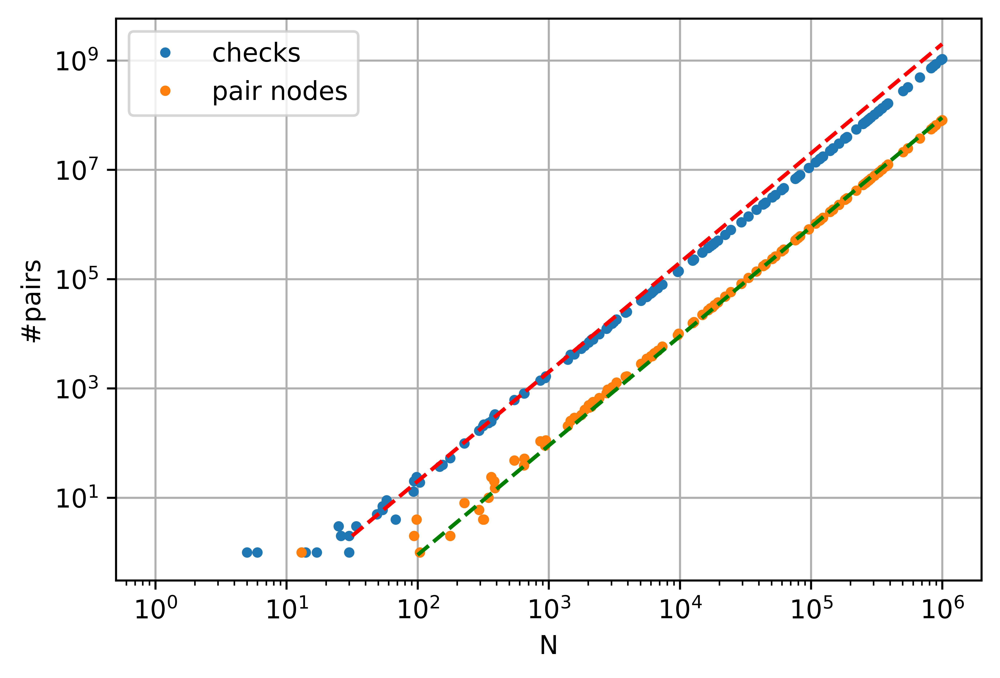

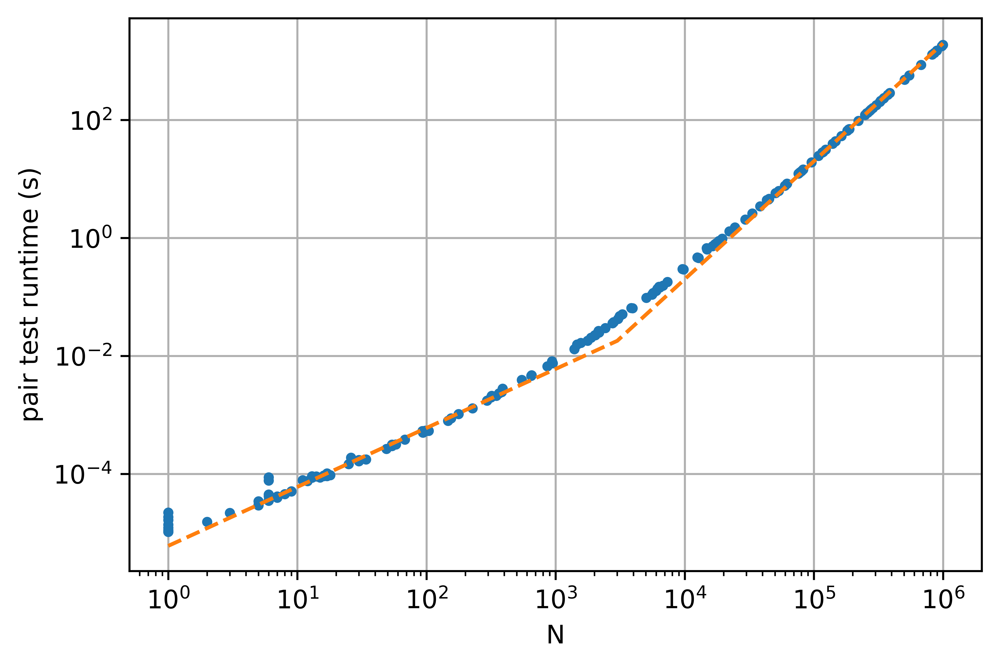

In [37]:
#Procedure A: pairtest with N
#if file was not yet loaded, do it now
if(len(data_A) == 0):
    f = open(dataPath + "\simData_A.txt", "r")
    data_A = ConvertToDataObject(f.read())
    f.close()

plt.figure()
plt.grid()
SimpleHeaderDataPlotDouble(data_A, "N", "checks", "pairs", "N", "#pairs", "checks", "pair nodes", "checks_vs_N.txt", "pairs_vs_N.txt")
x = np.logspace(2, 6, 1000)
plt.loglog(x, straightFunc(x, [0], [2], 9e-5), '--', color="green")
x = np.logspace(1.5, 6, 1000)
plt.loglog(x, straightFunc(x, [0], [2], 2e-3), '--', color="red")
plt.show()

plt.figure()
plt.grid()
SimpleHeaderDataPlot(data_A, "N", "initTime", "N", "pair test runtime (s)", "runtime_vs_N.txt")
x = np.logspace(0, 6, 1000)
plt.loglog(x, straightFunc(x, [0, 3e3], [1, 1], 2e-9), '--')
plt.show()

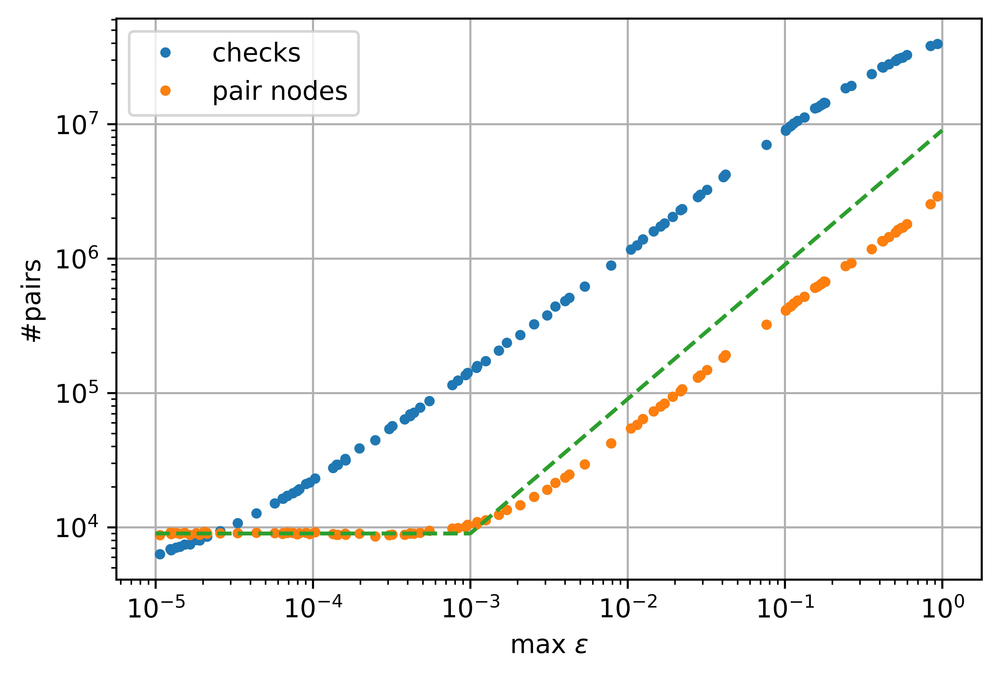

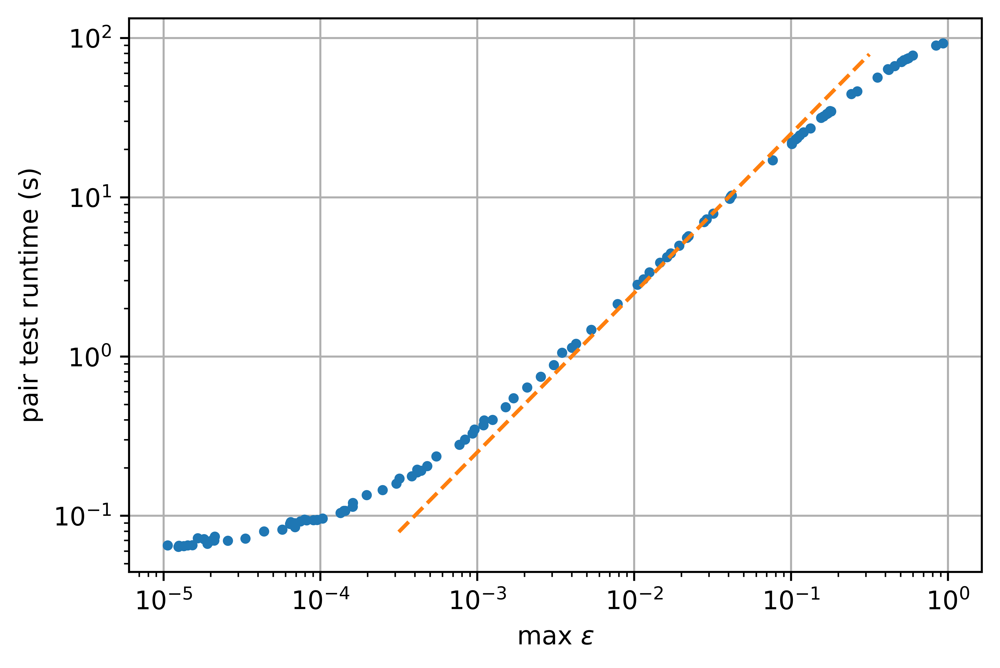

In [10]:
#Procedure C: pairtest with eps
#if file was not yet loaded, do it now
if(len(data_C) == 0):
    f = open(dataPath + "\simData_C.txt", "r")
    data_C = ConvertToDataObject(f.read())
    f.close()

plt.figure()
plt.grid()
SimpleHeaderDataPlotDouble(data_C, "maxeps", "checks", "pairs", "max $\epsilon$", "#pairs", "checks", "pair nodes", "checks_vs_eps.txt", "pairs_vs_eps.txt")
x = np.logspace(-5, 0, 1000)
plt.loglog(x, straightFunc(x, [1e-3], [1], 9e6), '--')
plt.show()

plt.figure()
plt.grid()
SimpleHeaderDataPlot(data_C, "maxeps", "initTime", "max $\epsilon$", "pair test runtime (s)", "runtime_vs_eps.txt")
x = np.logspace(-3.5, -0.5, 1000)
plt.loglog(x, x / 4e-3, '--')
plt.show()

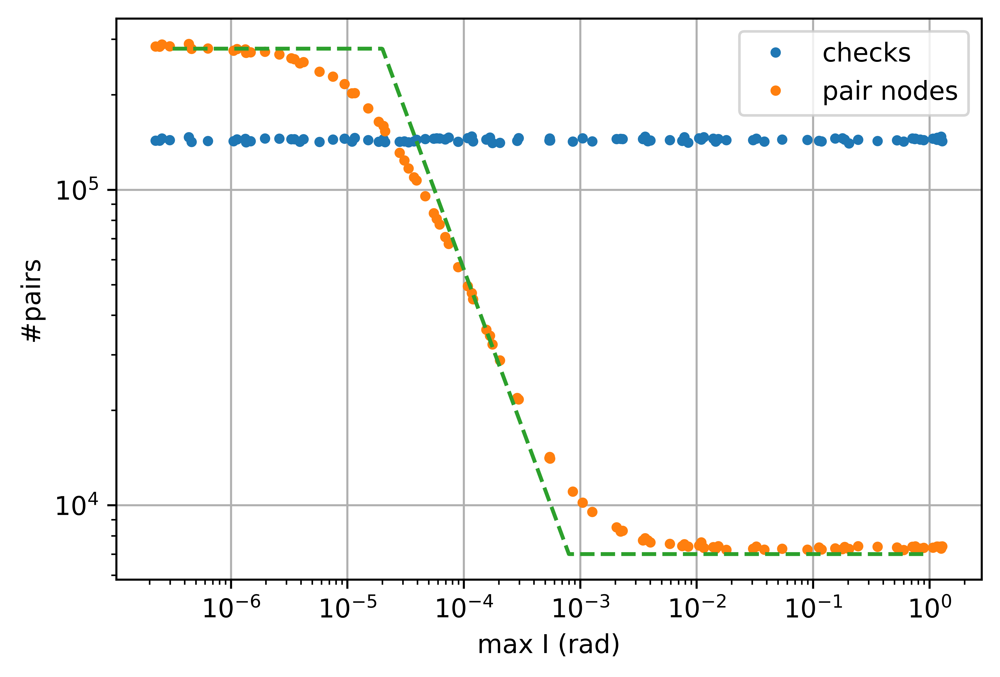

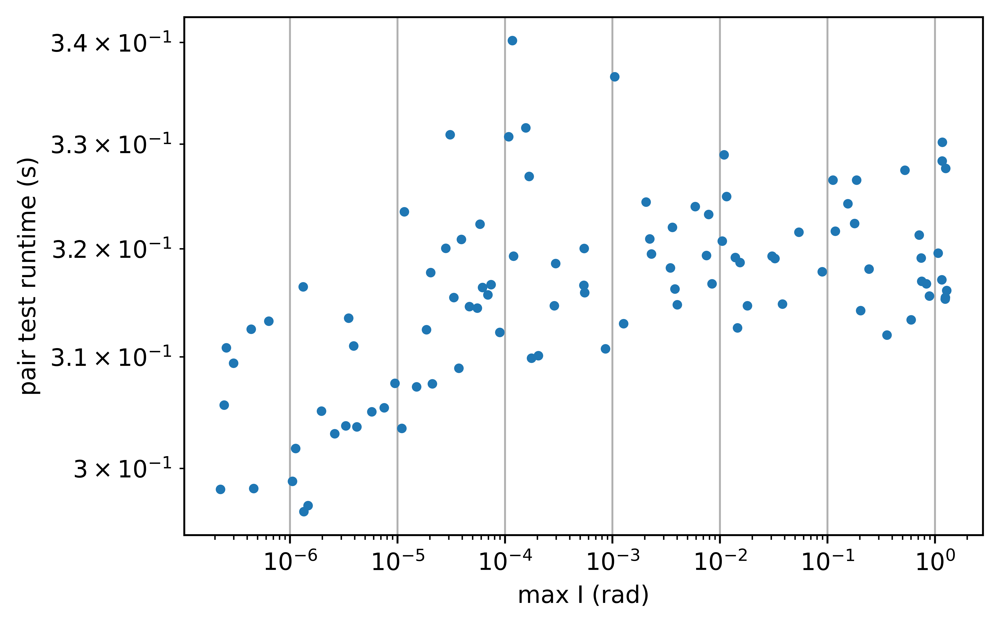

In [11]:
#Procedure D: pairtest with I
#if file was not yet loaded, do it now
if(len(data_D) == 0):
    f = open(dataPath + "\simData_D.txt", "r")
    data_D = ConvertToDataObject(f.read())
    f.close()

plt.figure()
plt.grid()
SimpleHeaderDataPlotDouble(data_D, "maxI", "checks", "pairs", "max I (rad)", "#pairs", "checks", "pair nodes", "checks_vs_I.txt", "pairs_vs_I.txt")
x = np.logspace(-6.5, 0, 1000)
plt.loglog(x, straightFunc(x, [2e-5, 8e-4], [-1, 1], 7e3), '--')
plt.show()

plt.figure()
plt.grid()
SimpleHeaderDataPlot(data_D, "maxI", "initTime", "max I (rad)", "pair test runtime (s)", "runtime_vs_I.txt")
plt.show()

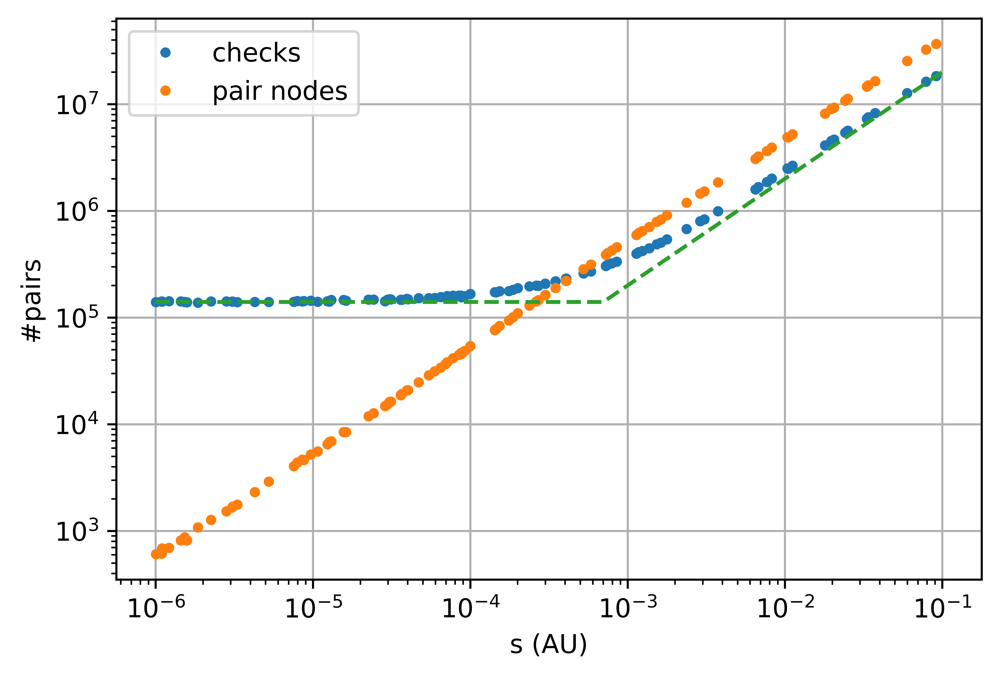

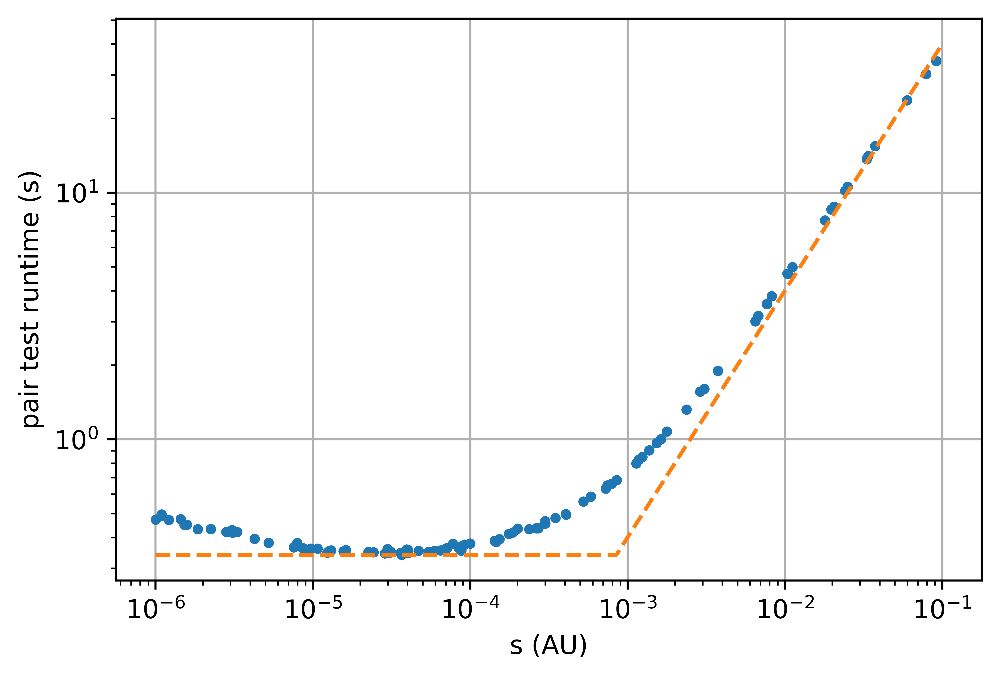

In [49]:
#Procedure E: pairtest with s
#if file was not yet loaded, do it now
if(len(data_E) == 0):
    f = open(dataPath + "\simData_E.txt", "r")
    data_E = ConvertToDataObject(f.read())
    f.close()

plt.figure()
plt.grid()
SimpleHeaderDataPlotDouble(data_E, "s", "checks", "pairs", "s (AU)", "#pairs", "checks", "pair nodes", "checks_vs_s.txt", "pairs_vs_s.txt")
x = np.logspace(-6, -1, 1000)
plt.loglog(x, straightFunc(x, [7e-4], [1], 2e8), '--')
plt.show()

plt.figure()
plt.grid()
SimpleHeaderDataPlot(data_E, "s", "initTime", "s (AU)", "pair test runtime (s)", "runtime_vs_s.txt")
plt.loglog(x, straightFunc(x, [8.5e-4], [1], 4e2), '--')
plt.show()

In [10]:
def phase2Runtime(data, simIndex):
    t = 0
    for i in range(len(data[simIndex][2])):
        t += data[simIndex][2][i][cIndex["RT"]]
    return t

In [11]:
def FullSimPlot_Runtime(data):
    #Total runtime vs N
    secondRuntime_arr = np.zeros(len(data))
    initRuntime_arr = np.zeros(len(data))
    N_arr = np.zeros(len(data))
    for i in range(len(data)):
        secondRuntime_arr[i] = phase2Runtime(data, i)
        initRuntime_arr[i] = data[i][0][hIndex["initTime"]]
        N_arr[i] = data[i][0][hIndex["N"]]
    
    plt.loglog(N_arr, initRuntime_arr, '.', label="initialization")
    plt.loglog(N_arr, secondRuntime_arr, '.', label="phase 2")
    plt.loglog(N_arr, initRuntime_arr + secondRuntime_arr, '.', label="total")
    plt.xlabel("N")
    plt.ylabel("runtime (s)")
    
def FullSimPlot_FrameRuntime(data):
    #Frame runtime vs current N
    for i in range(len(data)):
        frameRuntime_arr = np.array([])
        CurrentN_arr = np.array([])
        for j in range(len(data[i][2])):
            frameRuntime_arr = np.append(frameRuntime_arr, data[i][2][j][cIndex["RT"]])
            CurrentN_arr = np.append(CurrentN_arr, data[i][2][j][cIndex["#particles"]])
        plt.loglog(CurrentN_arr, frameRuntime_arr, '.', markersize=1)
    plt.xlabel("current N")
    plt.ylabel("frame runtime (s)")
    
def FullSimPlot_NumCollisions(data):
    #Number of collisions vs N
    col_arr = np.zeros(len(data))
    N_arr = np.zeros(len(data))
    for i in range(len(data)):
        col_arr[i] = len(data[i][2])
        N_arr[i] = data[i][0][hIndex["N"]]
    
    plt.loglog(N_arr, col_arr, '.')
    plt.xlabel("N")
    plt.ylabel("#collisions")
    
def FullSimPlot_LenCList(data):
    #length of collision list vs current N
    for i in range(len(data)):
        colL_arr = np.array([])
        CurrentN_arr = np.array([])
        for j in range(len(data[i][2])):
            colL_arr = np.append(colL_arr, data[i][2][j][cIndex["colListSize"]])
            CurrentN_arr = np.append(CurrentN_arr, data[i][2][j][cIndex["#particles"]])
        plt.loglog(CurrentN_arr, colL_arr, '.', markersize=1)
    plt.xlabel("current N")
    plt.ylabel("length of collision list")
    
def FullSimPlot_InitLenCList(data):
    #Initial length of collision list vs initial N
    colL_i_arr = np.zeros(len(data))
    N_arr = np.zeros(len(data))
    for i in range(len(data)):
        try:
            colL_i_arr[i] = data[i][2][0][cIndex["colListSize"]]
        except:
            colL_i_arr[i] = 0
        N_arr[i] = data[i][0][hIndex["N"]]
        
    plt.loglog(N_arr, colL_i_arr, '.')
    plt.xlabel("N")
    plt.ylabel("initial length of collision list")

def FullSimPlot_EndN(data):
    end_N_arr = np.zeros(len(data))
    N_arr = np.zeros(len(data))
    for i in range(len(data)):
        try:
            end_N_arr[i] = data[i][2][-1][cIndex["#particles"]]
        except:
            end_N_arr[i] = data[i][0][hIndex["N"]]
        N_arr[i] = data[i][0][hIndex["N"]]
    
    plt.loglog(N_arr, end_N_arr, '.')
    plt.xlabel("N")
    plt.ylabel("final N")

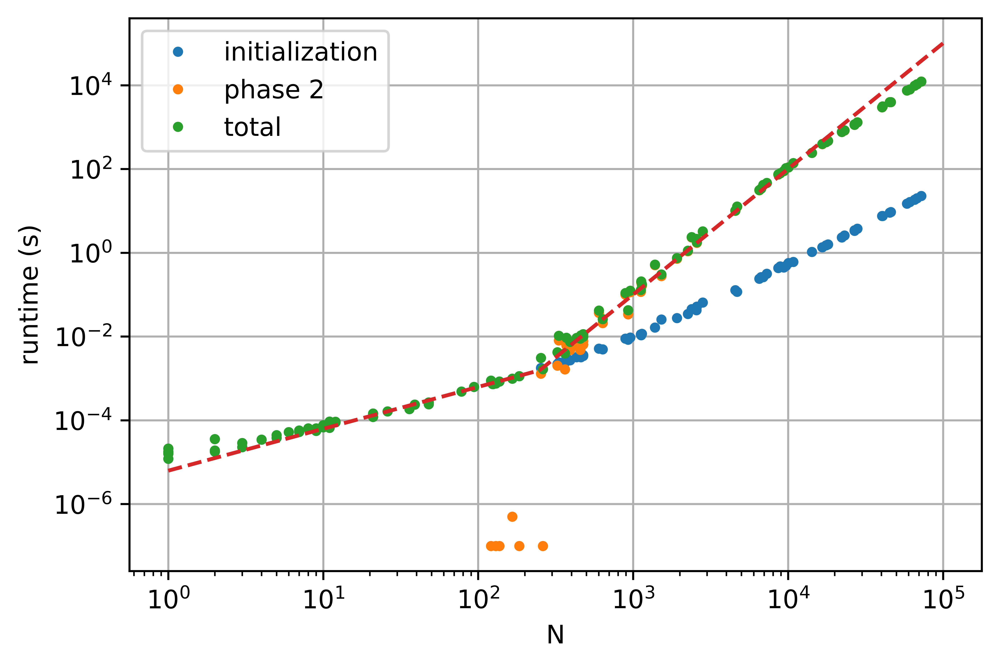

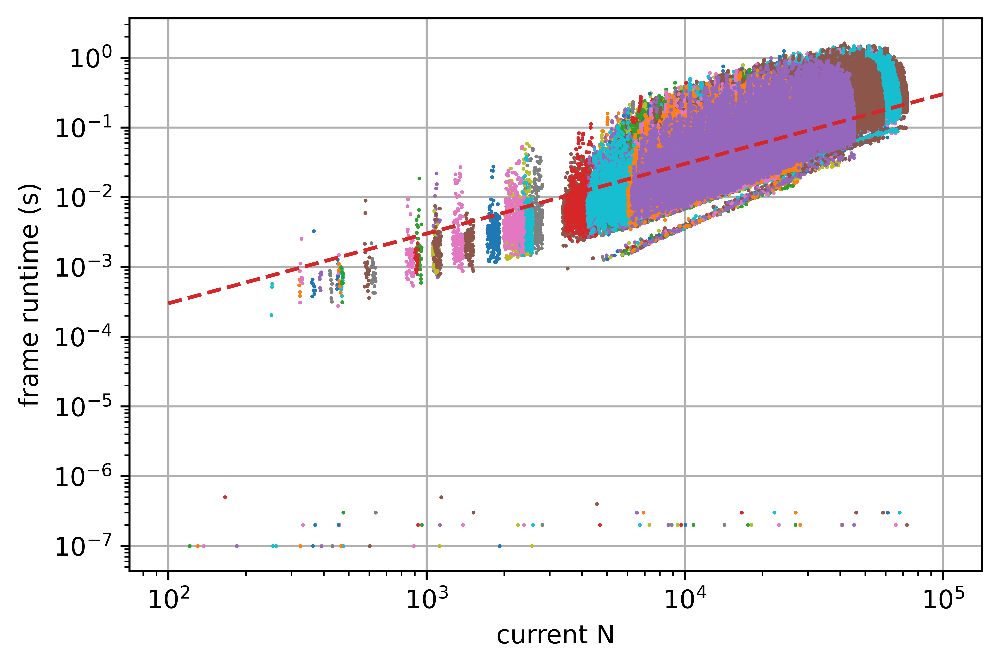

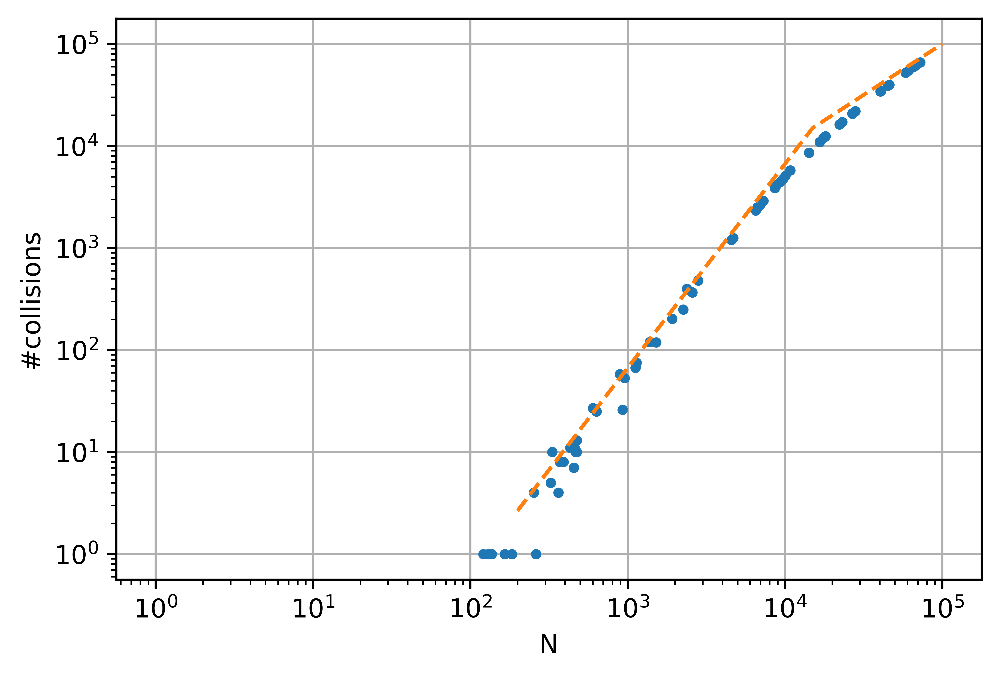

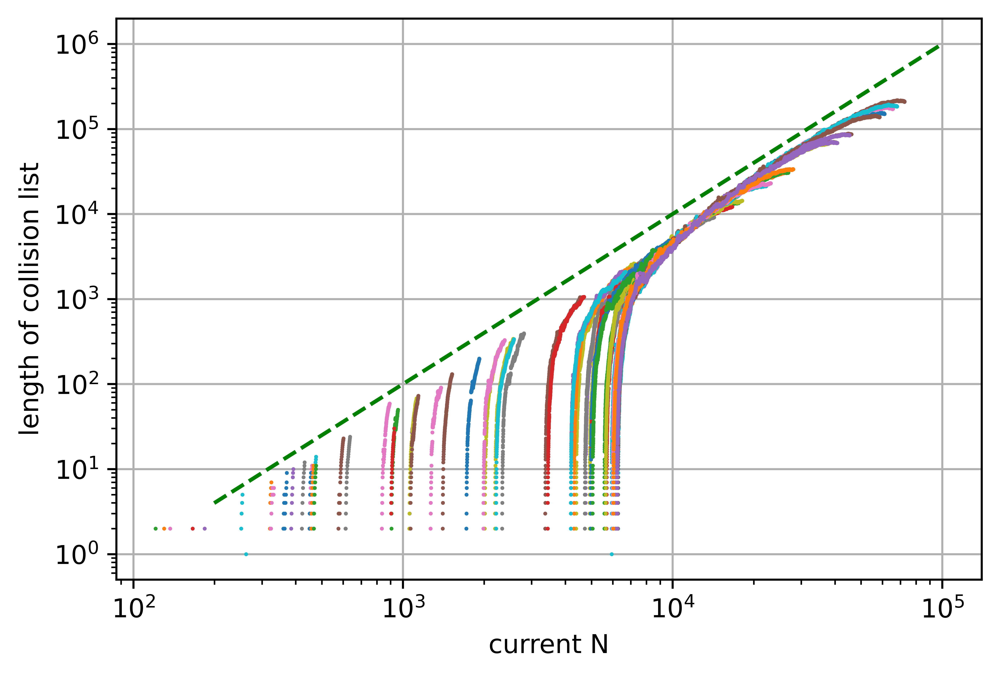

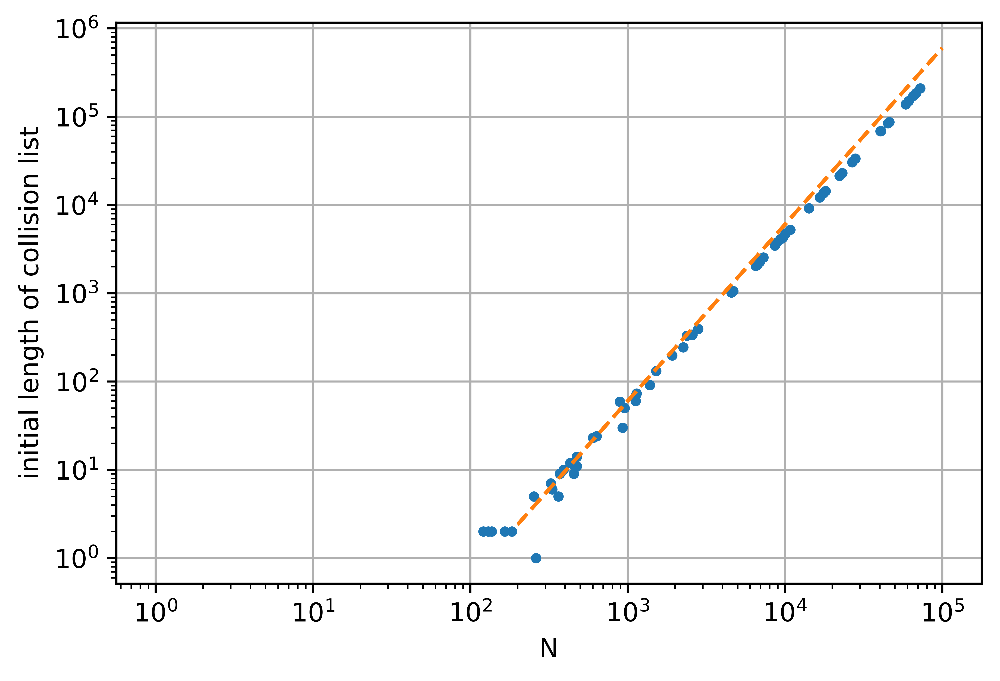

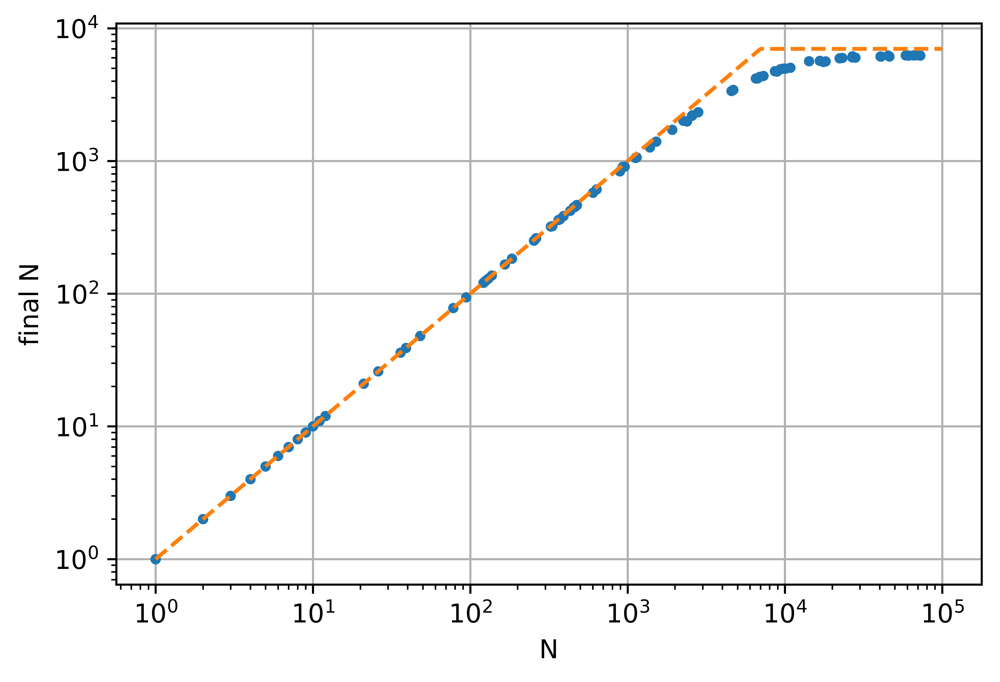

In [42]:
#Procedure B: full simulation with standard parameters
#if file was not yet loaded, do it now
if(len(data_B) == 0):
    f = open(dataPath + "\simData_B.txt", "r")
    data_B = ConvertToDataObject(f.read())
    f.close()


plt.figure()
plt.grid()
FullSimPlot_Runtime(data_B)
x = np.logspace(0, 5, 1000)
plt.loglog(x, straightFunc(x, [0, 2.5e2], [1, 2, -1], 1e-10), '--')
plt.legend()
plt.show()

plt.figure()
plt.grid()
FullSimPlot_FrameRuntime(data_B)
x = np.logspace(2, 5, 1000)
plt.loglog(x, straightFunc(x, [0], [1], 3e-6), '--')
plt.show()

plt.figure()
plt.grid()
FullSimPlot_NumCollisions(data_B)
x = np.logspace(2.3, 5, 1000)
plt.loglog(x, straightFunc(x, [2e2, 1.5e4], [2, -1], 1), '--')
plt.show()

plt.figure()
plt.grid()
FullSimPlot_LenCList(data_B)
plt.loglog(x, straightFunc(x, [0], [2], 1e-4), '--', color="green")
plt.show()

plt.figure()
plt.grid()
FullSimPlot_InitLenCList(data_B)
x = np.logspace(2.3, 5, 1000)
plt.loglog(x, straightFunc(x, [2e2], [2], 6e-5), '--')
plt.show()

plt.figure()
plt.grid()
FullSimPlot_EndN(data_B)
x = np.logspace(0, 5, 1000)
plt.loglog(x, straightFunc(x, [0, 7e3], [1, -1], 7e3), '--')
plt.show()

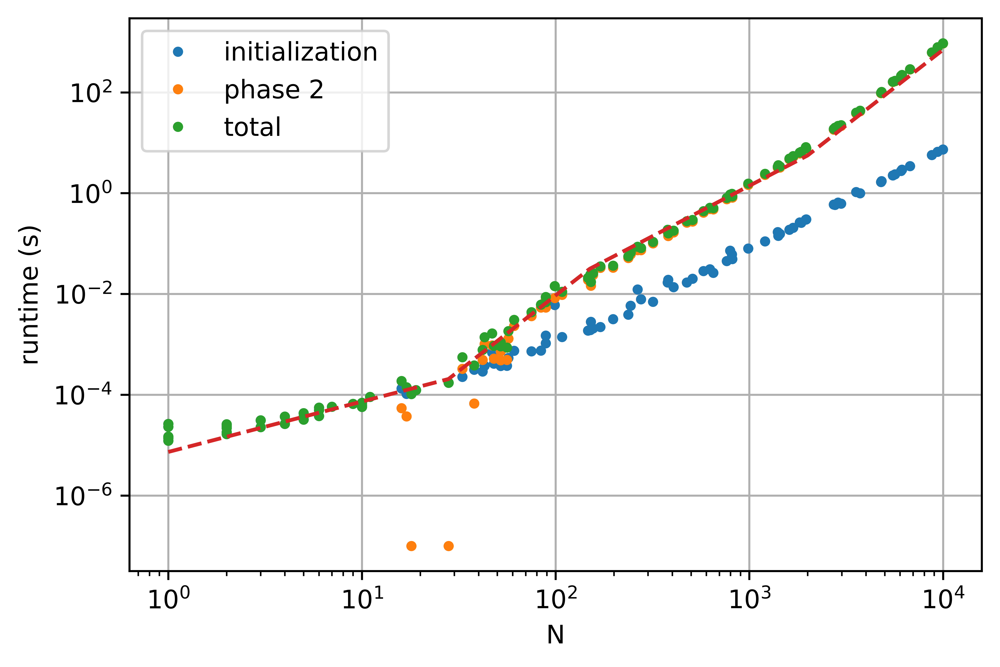

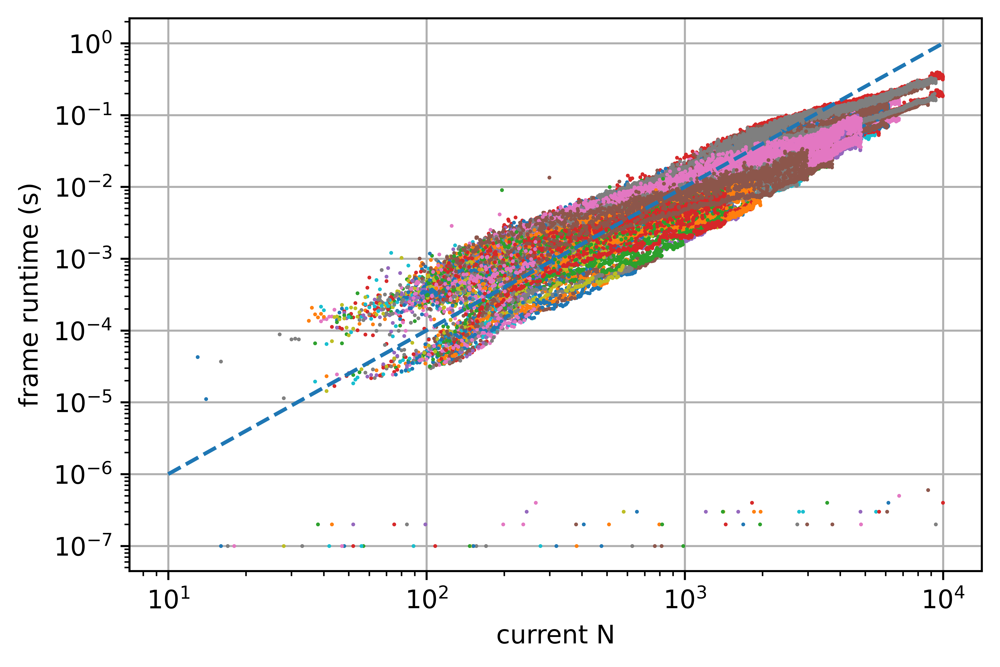

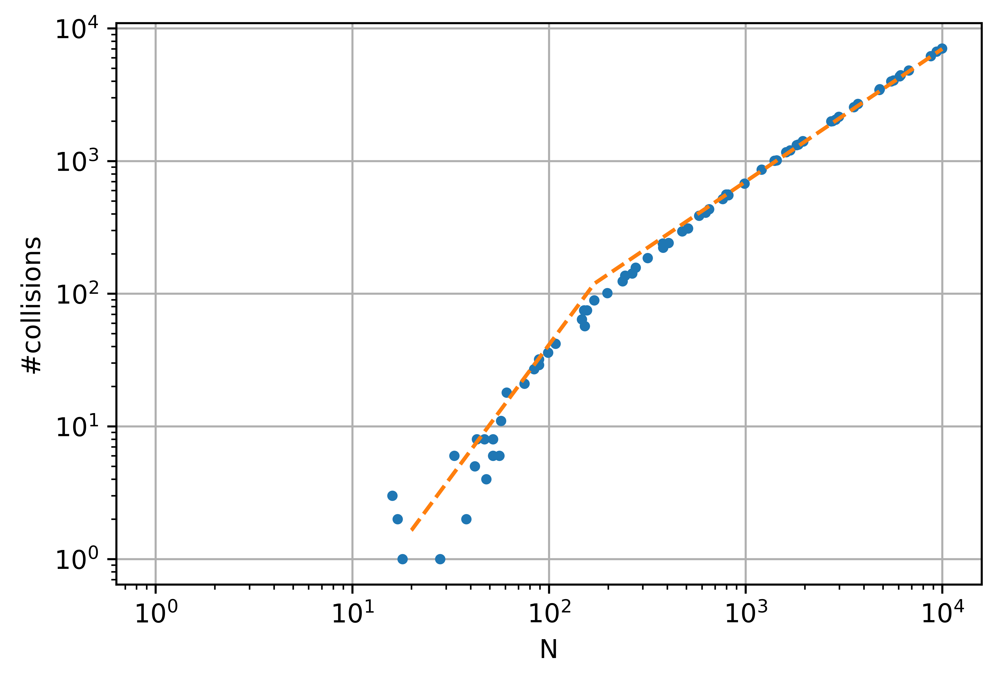

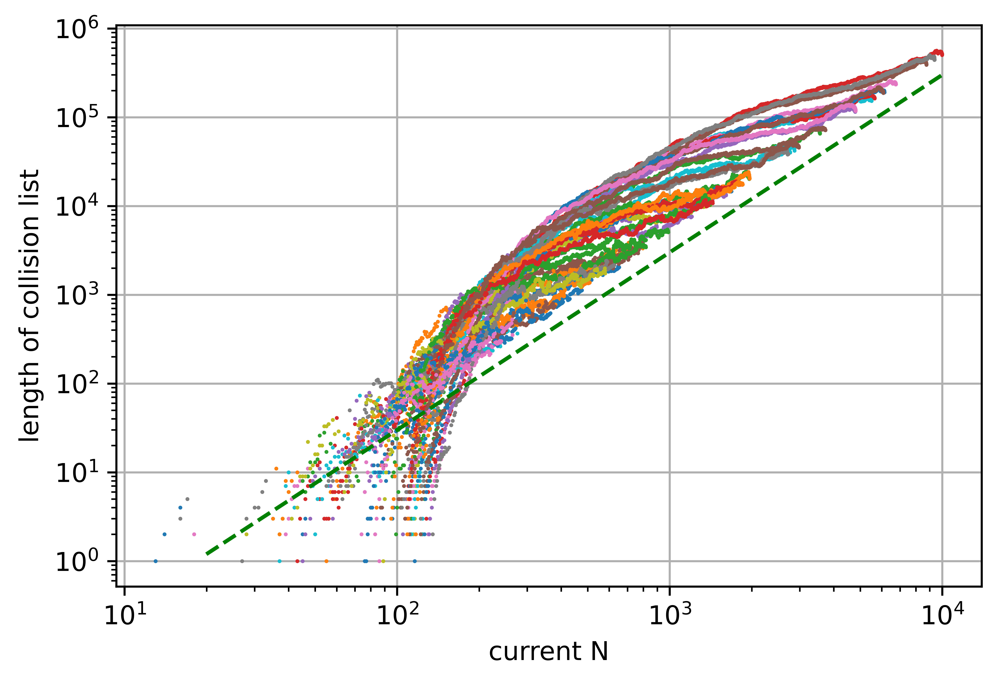

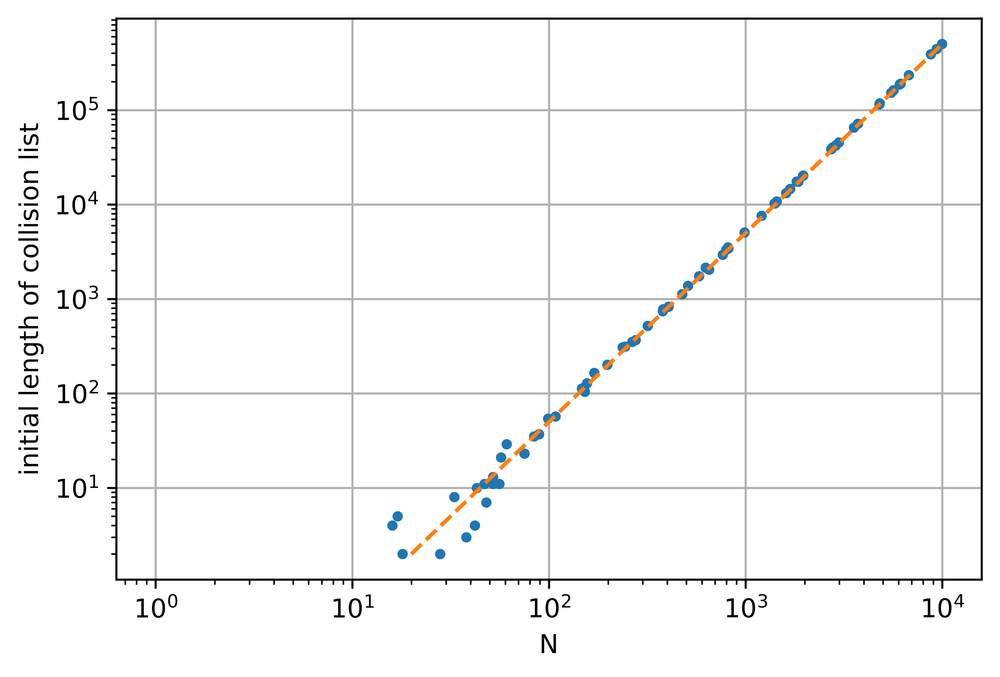

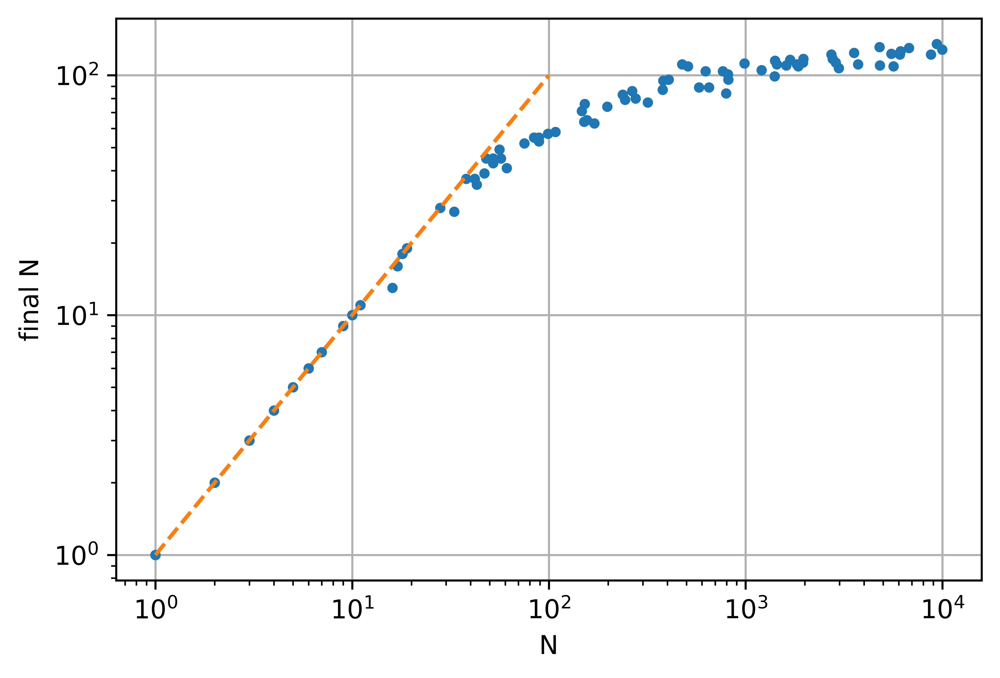

In [38]:
#Procedure F: full simulation with increased s
#if file was not yet loaded, do it now
if(len(data_F) == 0):
    f = open(dataPath + "\simData_F.txt", "r")
    data_F = ConvertToDataObject(f.read())
    f.close()
    
plt.figure()
plt.grid()
FullSimPlot_Runtime(data_F)
x = np.logspace(0, 4, 1000)
plt.loglog(x, straightFunc(x, [0, 2.8e1, 1.5e2, 2e3], [1, 2, -1, 1], 7e-10), '--')
plt.legend()
plt.show()

plt.figure()
plt.grid()
FullSimPlot_FrameRuntime(data_F)
x = np.logspace(1, 4, 1000)
plt.loglog(x, straightFunc(x, [0], [2], 1e-8), '--')
plt.show()

plt.figure()
plt.grid()
FullSimPlot_NumCollisions(data_F)
x = np.logspace(1.3, 4, 1000)
plt.loglog(x, straightFunc(x, [2e1, 1.7e2], [2, -1], 7e-1), '--')
plt.show()

plt.figure()
plt.grid()
FullSimPlot_LenCList(data_F)
plt.loglog(x, straightFunc(x, [0], [2], 3e-3), '--', color="green")
plt.show()

plt.figure()
plt.grid()
FullSimPlot_InitLenCList(data_F)
x = np.logspace(1.3, 4, 1000)
plt.loglog(x, straightFunc(x, [1e1], [2], 5e-3), '--')
plt.show()

plt.figure()
plt.grid()
FullSimPlot_EndN(data_F)
x = np.logspace(0, 2, 1000)
plt.loglog(x, straightFunc(x, [0], [1], 1), '--')
plt.show()